In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import model_utility, visuals_utility, data_utility, color_utility

import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.colors import ListedColormap

import warnings
from pandas.core.generic import SettingWithCopyWarning

warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=SettingWithCopyWarning)


### Data

In [2]:
original_df = pd.read_csv("https://projects.fivethirtyeight.com/nfl-api/nfl_elo.csv")
original_df

,date,season,neutral,playoff,team1,team2,elo1_pre,elo2_pre,elo_prob1,elo_prob2,...,qb2_game_value,qb1_value_post,qb2_value_post,qbelo1_post,qbelo2_post,score1,score2,quality,importance,total_rating
0,1920-09-26,1920,0,NaN,RII,STP,1503.947000,1300.000000,0.824651,0.175349,...,NaN,NaN,NaN,NaN,NaN,48,0,NaN,NaN,NaN
1,1920-10-03,1920,0,NaN,AKR,WHE,1503.420000,1300.000000,0.824212,0.175788,...,NaN,NaN,NaN,NaN,NaN,43,0,NaN,NaN,NaN
2,1920-10-03,1920,0,NaN,BFF,WBU,1478.004000,1300.000000,0.802000,0.198000,...,NaN,NaN,NaN,NaN,NaN,32,6,NaN,NaN,NaN
3,1920-10-03,1920,0,NaN,DAY,COL,1493.002000,1504.908000,0.575819,0.424181,...,NaN,NaN,NaN,NaN,NaN,14,0,NaN,NaN,NaN
4,1920-10-03,1920,0,NaN,RII,MUN,1516.108000,1478.004000,0.644171,0.355829,...,NaN,NaN,NaN,NaN,NaN,45,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,2023-01-22,2022,0,d,BUF,CIN,1731.516093,1690.292481,0.648277,0.351723,...,303.726984,225.069808,230.466056,1675.570770,1690.152492,10,27,99.0,100.0,100.0
17375,2023-01-22,2022,0,d,SF,DAL,1708.971847,1640.135262,0.683613,0.316387,...,105.114287,109.133365,191.883277,1719.153115,1619.647034,19,12,98.0,100.0,99.0
17376,2023-01-29,2022,0,c,PHI,SF,1621.987292,1721.375447,0.450672,0.549328,...,56.917741,246.826740,103.911803,1645.507079,1693.213858,31,7,99.0,100.0,100.0
17377,2023-01-29,2022,0,c,KC,CIN,1735.804844,1729.668918,0.600966,0.399034,...,28.185998,280.177715,210.238050,1708.664922,1678.805820,23,20,100.0,100.0,100.0


In [3]:
original_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 33 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            17379 non-null  object 
 1   season          17379 non-null  int64  
 2   neutral         17379 non-null  int64  
 3   playoff         616 non-null    object 
 4   team1           17379 non-null  object 
 5   team2           17379 non-null  object 
 6   elo1_pre        17379 non-null  float64
 7   elo2_pre        17379 non-null  float64
 8   elo_prob1       17379 non-null  float64
 9   elo_prob2       17379 non-null  float64
 10  elo1_post       17379 non-null  float64
 11  elo2_post       17379 non-null  float64
 12  qbelo1_pre      15217 non-null  float64
 13  qbelo2_pre      15217 non-null  float64
 14  qb1             15217 non-null  object 
 15  qb2             15217 non-null  object 
 16  qb1_value_pre   15217 non-null  float64
 17  qb2_value_pre   15217 non-null 

In [4]:
original_df.columns

Index(['date', 'season', 'neutral', 'playoff', 'team1', 'team2', 'elo1_pre',
       'elo2_pre', 'elo_prob1', 'elo_prob2', 'elo1_post', 'elo2_post',
       'qbelo1_pre', 'qbelo2_pre', 'qb1', 'qb2', 'qb1_value_pre',
       'qb2_value_pre', 'qb1_adj', 'qb2_adj', 'qbelo_prob1', 'qbelo_prob2',
       'qb1_game_value', 'qb2_game_value', 'qb1_value_post', 'qb2_value_post',
       'qbelo1_post', 'qbelo2_post', 'score1', 'score2', 'quality',
       'importance', 'total_rating'],
      dtype='object')

In [5]:
data_utility.get_data_types(original_df)

{'category': ['date', 'playoff', 'team1', 'team2', 'qb1', 'qb2'],
 'numerical': ['season',
  'neutral',
  'elo1_pre',
  'elo2_pre',
  'elo_prob1',
  'elo_prob2',
  'elo1_post',
  'elo2_post',
  'qbelo1_pre',
  'qbelo2_pre',
  'qb1_value_pre',
  'qb2_value_pre',
  'qb1_adj',
  'qb2_adj',
  'qbelo_prob1',
  'qbelo_prob2',
  'qb1_game_value',
  'qb2_game_value',
  'qb1_value_post',
  'qb2_value_post',
  'qbelo1_post',
  'qbelo2_post',
  'score1',
  'score2',
  'quality',
  'importance',
  'total_rating'],
 'other': []}

In [6]:
# selecting only features that will be used for analysis and modeling
features = [ 'season', 'team1', 'team2', 'elo1_pre', 'elo2_pre', 'elo_prob1', 'elo_prob2', 
       'qbelo1_pre', 'qbelo2_pre', 'qbelo_prob1', 'qbelo_prob2', 'quality',
       'score1', 'score2']

In [7]:
cleaned_df = original_df[features].copy()
cleaned_df.dropna(inplace=True)
cleaned_df.reset_index(drop=True, inplace=True)
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15217 entries, 0 to 15216
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   season       15217 non-null  int64  
 1   team1        15217 non-null  object 
 2   team2        15217 non-null  object 
 3   elo1_pre     15217 non-null  float64
 4   elo2_pre     15217 non-null  float64
 5   elo_prob1    15217 non-null  float64
 6   elo_prob2    15217 non-null  float64
 7   qbelo1_pre   15217 non-null  float64
 8   qbelo2_pre   15217 non-null  float64
 9   qbelo_prob1  15217 non-null  float64
 10  qbelo_prob2  15217 non-null  float64
 11  quality      15217 non-null  float64
 12  score1       15217 non-null  int64  
 13  score2       15217 non-null  int64  
dtypes: float64(9), int64(3), object(2)
memory usage: 1.6+ MB


In [8]:
# check how the numerical features are distributed
numerical_features_df = cleaned_df.select_dtypes(include=['float64', 'int64'])
numerical_features_df.describe()

,season,elo1_pre,elo2_pre,elo_prob1,elo_prob2,qbelo1_pre,qbelo2_pre,qbelo_prob1,qbelo_prob2,quality,score1,score2
count,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000,15217.000000
mean,1992.008346,1504.959111,1503.056400,0.582971,0.417029,1504.285087,1502.863032,0.575368,0.424632,47.899717,22.547546,19.892554
std,19.180654,103.099592,101.645682,0.172728,0.172728,99.897968,98.551383,0.178580,0.178580,29.328586,10.699834,10.268085
min,1950.000000,1153.902000,1156.551000,0.070953,0.029484,1149.699743,1152.474651,0.060988,0.032788,0.000000,0.000000,0.000000
25%,1977.000000,1432.594000,1432.657000,0.461192,0.285889,1434.575894,1434.791401,0.446484,0.286263,21.000000,14.000000,13.000000
50%,1994.000000,1505.259307,1504.159000,0.594044,0.405956,1505.757028,1504.378560,0.586942,0.413058,48.000000,22.000000,20.000000
75%,2008.000000,1578.047000,1576.821000,0.714111,0.538808,1574.540239,1574.626367,0.713737,0.553516,73.000000,30.000000,27.000000
max,2022.000000,1839.663000,1849.484000,0.970516,0.929047,1806.390160,1814.366226,0.967212,0.939012,100.000000,72.000000,62.000000


In [9]:
# Add winnder both as string and binary
cleaned_df['winner'] = np.where(cleaned_df['score1'] > cleaned_df['score2'], 'H', 'V')
cleaned_df['winner_binary'] = np.where(cleaned_df['score1'] > cleaned_df['score2'], 0, 1).astype(int)
cleaned_df

,season,team1,team2,elo1_pre,elo2_pre,elo_prob1,elo_prob2,qbelo1_pre,qbelo2_pre,qbelo_prob1,qbelo_prob2,quality,score1,score2,winner,winner_binary
0,1950,PHI,CLE,1674.314000,1647.304000,0.629402,0.370598,1672.671374,1643.768931,0.620653,0.379347,98.0,10,35,V,1
1,1950,BCL,WSH,1337.541000,1454.448000,0.425851,0.574149,1337.632585,1454.722542,0.425357,0.574643,6.0,14,38,V,1
2,1950,PIT,NYG,1485.849000,1461.717000,0.625529,0.374471,1485.701701,1462.405630,0.612587,0.387413,35.0,7,18,V,1
3,1950,GB,DET,1353.646000,1449.128000,0.456245,0.543755,1354.399933,1449.703511,0.443900,0.556100,7.0,7,45,V,1
4,1950,LAR,CHI,1564.606000,1628.688000,0.501321,0.498679,1564.941808,1628.083975,0.498518,0.501482,88.0,20,24,V,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,2022,BUF,CIN,1731.516093,1690.292481,0.648277,0.351723,1714.417123,1651.306140,0.641191,0.358809,99.0,10,27,V,1
15213,2022,SF,DAL,1708.971847,1640.135262,0.683613,0.316387,1702.555028,1636.245121,0.589496,0.410504,98.0,19,12,H,0
15214,2022,PHI,SF,1621.987292,1721.375447,0.450672,0.549328,1619.567823,1719.153115,0.586019,0.413981,99.0,31,7,H,0
15215,2022,KC,CIN,1735.804844,1729.668918,0.600966,0.399034,1697.318250,1690.152492,0.580287,0.419713,100.0,23,20,H,0


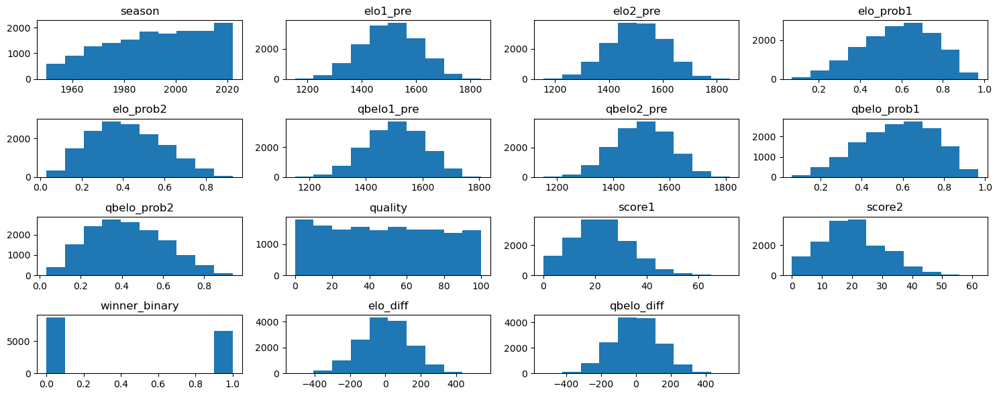

In [22]:
# let us see how the data is distributed across features
cleaned_df.hist(figsize=(15,6), grid=False)
plt.tight_layout()
plt.show()

<Figure size 1500x1000 with 0 Axes>

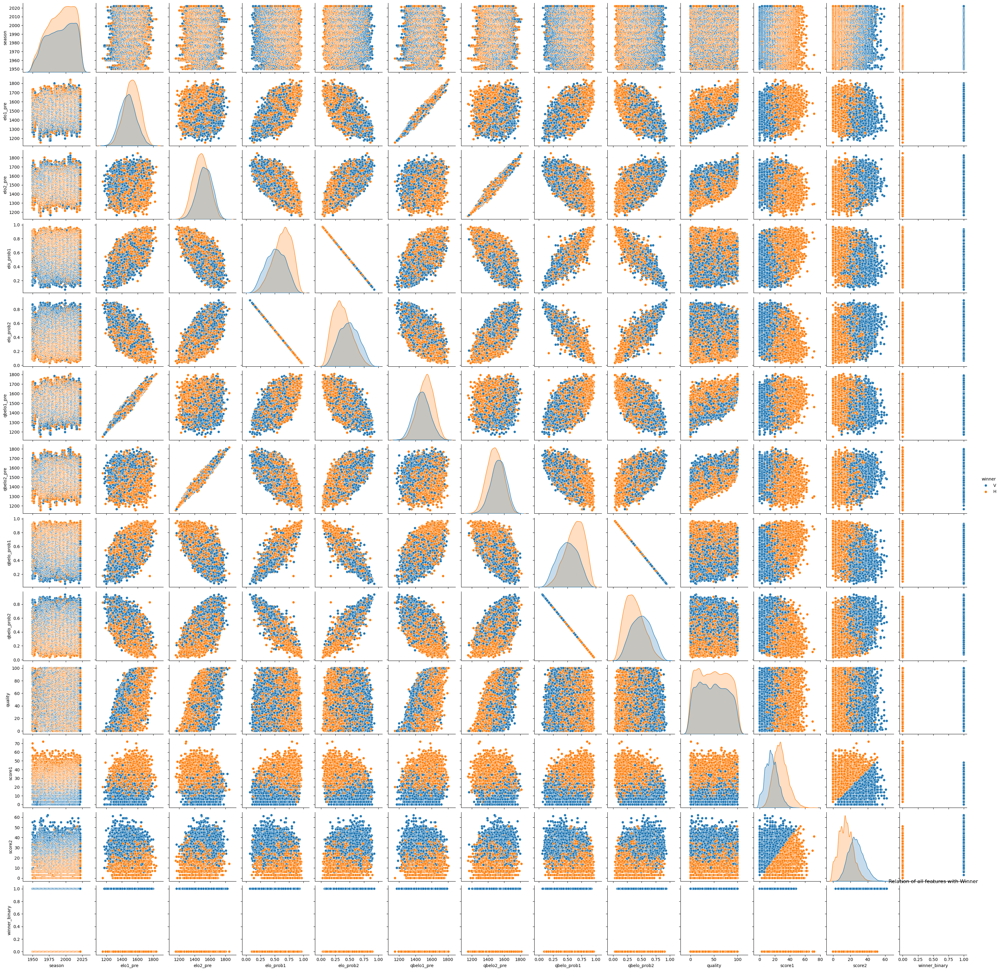

In [10]:
# plot all the features and see how they are related to winner
plt.figure(figsize=(15,10))
sns.pairplot(data=cleaned_df,  hue='winner')
plt.title("Relation of all features with Winner")
plt.show()

Text(0.5, 1.0, 'Team ELO Ratings vs Winners')

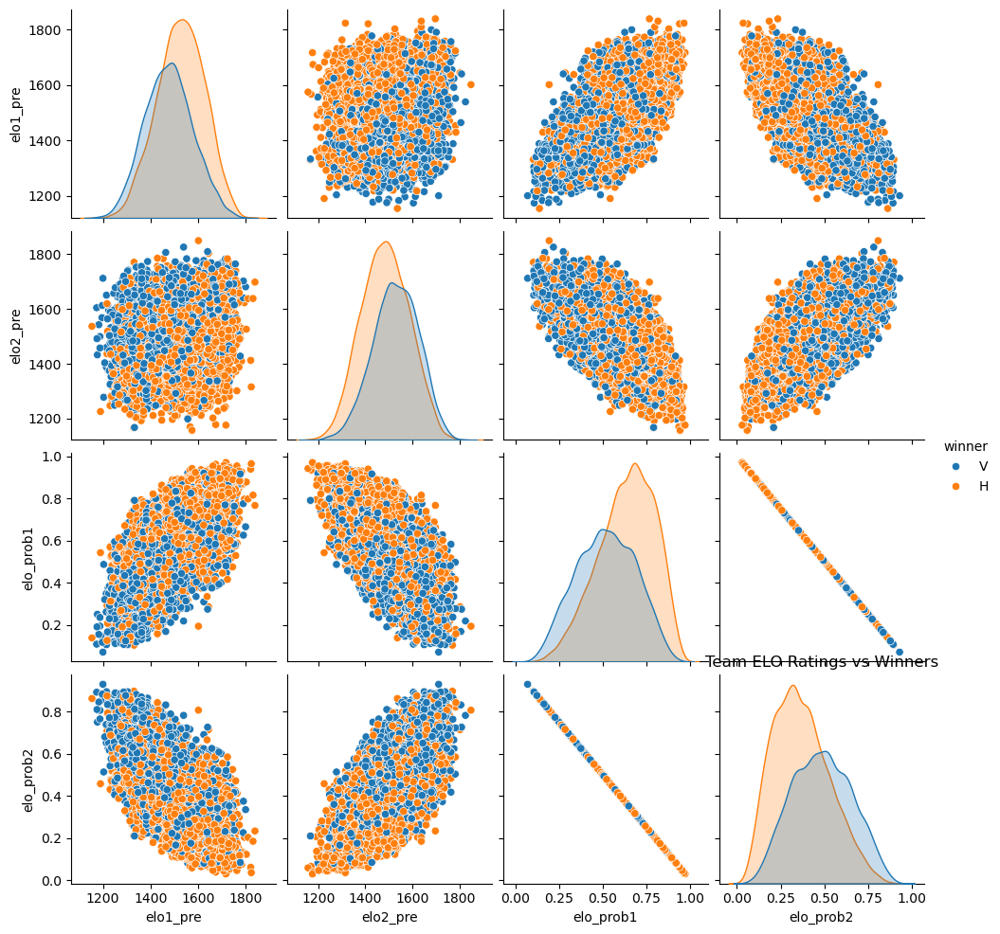

In [11]:
#lets check just the elo ratings by team vs winners
elo_data = cleaned_df[['elo1_pre', 'elo2_pre', 'elo_prob1', 'elo_prob2', 'winner']].copy()
sns.pairplot(data=elo_data, hue='winner')
plt.title("Team ELO Ratings vs Winners")

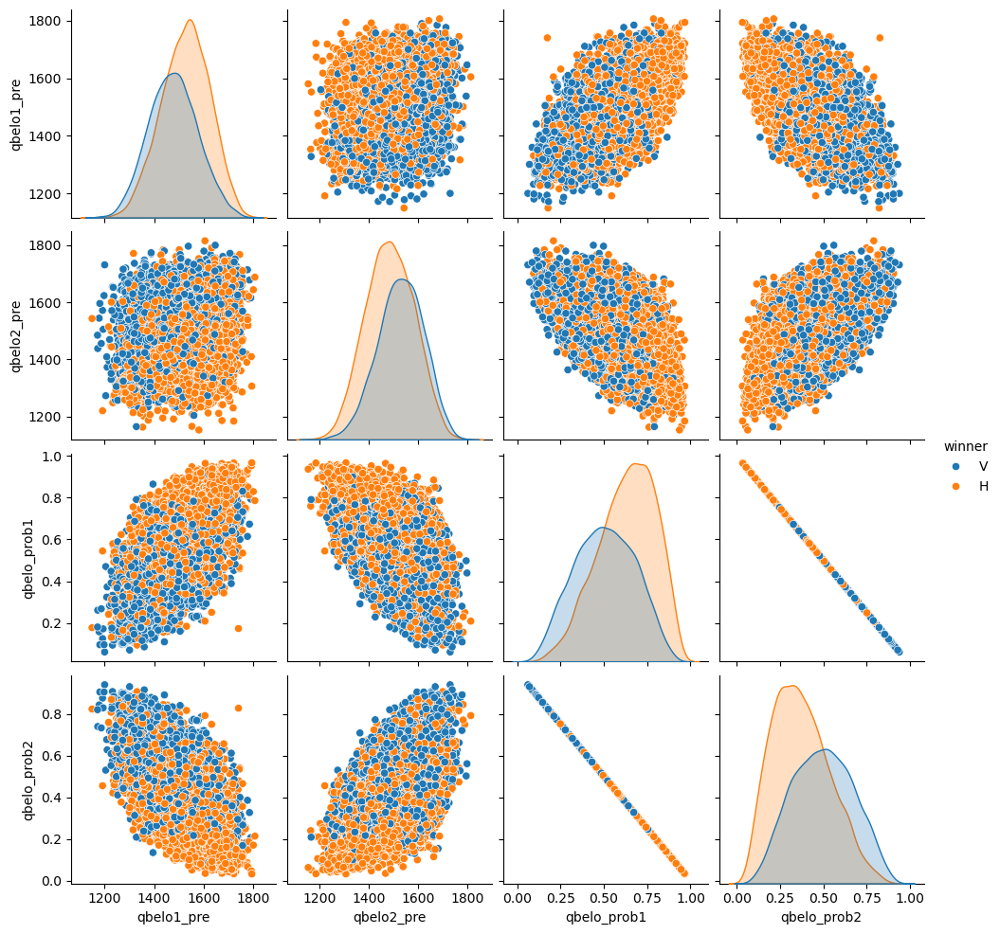

In [12]:
#lets check just the elo ratings by quarter back vs winners
elo_data = cleaned_df[['qbelo1_pre', 'qbelo2_pre', 'qbelo_prob1', 'qbelo_prob2', 'winner']].copy()
sns.pairplot(data=elo_data, hue='winner')

### In both scenarios Team and Quarterback ELO ratings show how the teams perform. Higher the rating better the teams perform and won. You can see the higher density of wins of home vs visitor based on elo1 vs elo2 ratings both for teams and quarterbacks. This tells that ELO ratings are somewhat good at predicting the games. There are many times the ratings does have -ve impact on the game, hence somewhat good.

## Let us check the correlation between the team 1/2 ratings vs their scores.

In [13]:
# get correlation of all the numerical features
corrrelation_matrix = numerical_features_df.corr()
corrrelation_matrix

,season,elo1_pre,elo2_pre,elo_prob1,elo_prob2,qbelo1_pre,qbelo2_pre,qbelo_prob1,qbelo_prob2,quality,score1,score2
season,1.000000,0.062069,0.059724,0.005290,-0.005290,0.058614,0.057272,0.000660,-0.000660,0.068205,0.044829,0.062200
elo1_pre,0.062069,1.000000,0.074498,0.680197,-0.680197,0.988394,0.071208,0.659974,-0.659974,0.690554,0.218365,-0.185654
elo2_pre,0.059724,0.074498,1.000000,-0.670529,0.670529,0.072453,0.988008,-0.627231,0.627231,0.683880,-0.169573,0.200336
elo_prob1,0.005290,0.680197,-0.670529,1.000000,-1.000000,0.673140,-0.663798,0.952263,-0.952263,0.018015,0.282634,-0.283279
elo_prob2,-0.005290,-0.680197,0.670529,-1.000000,1.000000,-0.673140,0.663798,-0.952263,0.952263,-0.018015,-0.282634,0.283279
qbelo1_pre,0.058614,0.988394,0.072453,0.673140,-0.673140,1.000000,0.069704,0.665596,-0.665596,0.693825,0.219378,-0.187191
qbelo2_pre,0.057272,0.071208,0.988008,-0.663798,0.663798,0.069704,1.000000,-0.632622,0.632622,0.685759,-0.171332,0.200697
qbelo_prob1,0.000660,0.659974,-0.627231,0.952263,-0.952263,0.665596,-0.632622,1.000000,-1.000000,0.031051,0.292199,-0.290769
qbelo_prob2,-0.000660,-0.659974,0.627231,-0.952263,0.952263,-0.665596,0.632622,-1.000000,1.000000,-0.031051,-0.292199,0.290769
quality,0.068205,0.690554,0.683880,0.018015,-0.018015,0.693825,0.685759,0.031051,-0.031051,1.000000,0.047236,0.016410


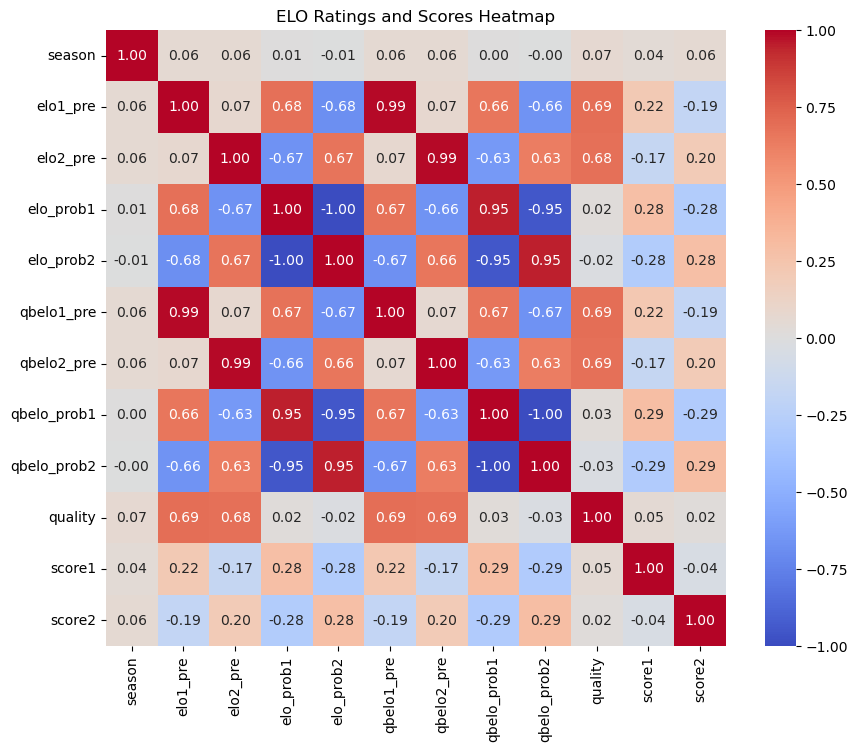

In [14]:
# plot an heatmap to easily analyze the correlation
plt.figure(figsize=(10, 8))
sns.heatmap(corrrelation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"fontsize": 10})
plt.title('ELO Ratings and Scores Heatmap')
plt.show()

#### We can see that team 1 ratings is positively correlated to their scorings and similarly team 2 is -vely correlated to team1's ratings. And Viceversa. Team ELO rating and Quarterback ELO ratings are highly correleated with almost 1 for both teams. 

In [15]:
# create derived features to analyze more
# calculate elo ratings difference and see how different it is between teams and
# quarter backs of 1 and 2
cleaned_df['elo_diff'] = (cleaned_df['elo1_pre'] - cleaned_df['elo2_pre'])
cleaned_df['qbelo_diff'] = (cleaned_df['qbelo1_pre'] - cleaned_df['qbelo2_pre'])

cleaned_df

,season,team1,team2,elo1_pre,elo2_pre,elo_prob1,elo_prob2,qbelo1_pre,qbelo2_pre,qbelo_prob1,qbelo_prob2,quality,score1,score2,winner,winner_binary,elo_diff,qbelo_diff
0,1950,PHI,CLE,1674.314000,1647.304000,0.629402,0.370598,1672.671374,1643.768931,0.620653,0.379347,98.0,10,35,V,1,27.010000,28.902443
1,1950,BCL,WSH,1337.541000,1454.448000,0.425851,0.574149,1337.632585,1454.722542,0.425357,0.574643,6.0,14,38,V,1,-116.907000,-117.089957
2,1950,PIT,NYG,1485.849000,1461.717000,0.625529,0.374471,1485.701701,1462.405630,0.612587,0.387413,35.0,7,18,V,1,24.132000,23.296071
3,1950,GB,DET,1353.646000,1449.128000,0.456245,0.543755,1354.399933,1449.703511,0.443900,0.556100,7.0,7,45,V,1,-95.482000,-95.303577
4,1950,LAR,CHI,1564.606000,1628.688000,0.501321,0.498679,1564.941808,1628.083975,0.498518,0.501482,88.0,20,24,V,1,-64.082000,-63.142167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15212,2022,BUF,CIN,1731.516093,1690.292481,0.648277,0.351723,1714.417123,1651.306140,0.641191,0.358809,99.0,10,27,V,1,41.223612,63.110983
15213,2022,SF,DAL,1708.971847,1640.135262,0.683613,0.316387,1702.555028,1636.245121,0.589496,0.410504,98.0,19,12,H,0,68.836585,66.309907
15214,2022,PHI,SF,1621.987292,1721.375447,0.450672,0.549328,1619.567823,1719.153115,0.586019,0.413981,99.0,31,7,H,0,-99.388154,-99.585292
15215,2022,KC,CIN,1735.804844,1729.668918,0.600966,0.399034,1697.318250,1690.152492,0.580287,0.419713,100.0,23,20,H,0,6.135927,7.165757


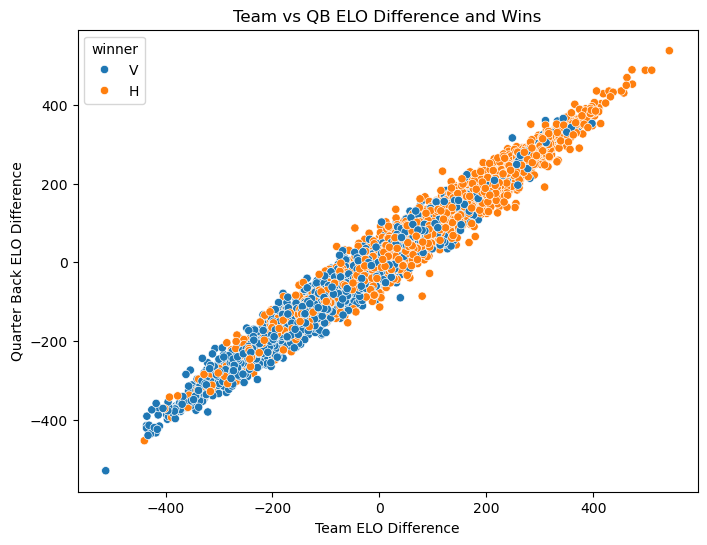

In [24]:
# let us see how the team and quarter back rating difference impact winning
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_df, x='elo_diff', y='qbelo_diff', hue='winner')
plt.title("Team vs QB ELO Difference and Wins")
plt.xlabel("Team ELO Difference")
plt.ylabel("Quarter Back ELO Difference")
plt.show()

#### We can see that positive difference tends to home team winning and vice versa which tells most of the time ELO ratings predicts home team as an advantage. 

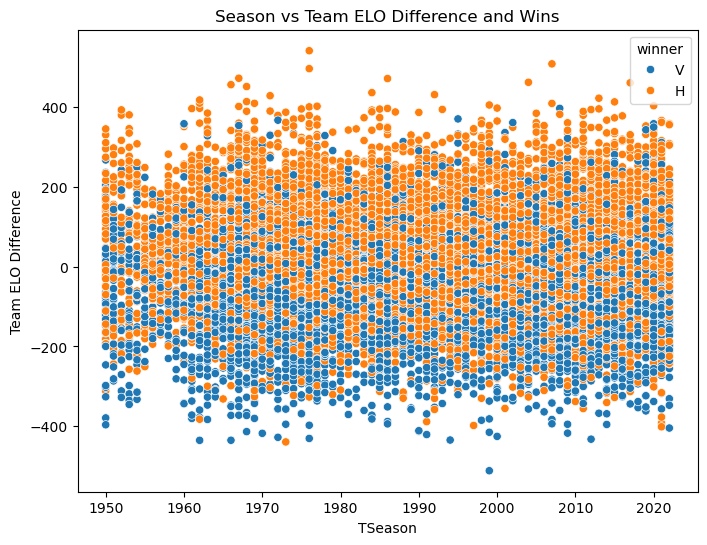

In [26]:
# let us see how the team and quarter back rating difference impact winning
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_df, x='season', y='elo_diff', hue='winner')
plt.title("Season vs Team ELO Difference and Wins")
plt.xlabel("TSeason")
plt.ylabel("Team ELO Difference")
plt.show()

We can see that almost all seasons the +ve rating difference means Home team win but we do have some outliers. 

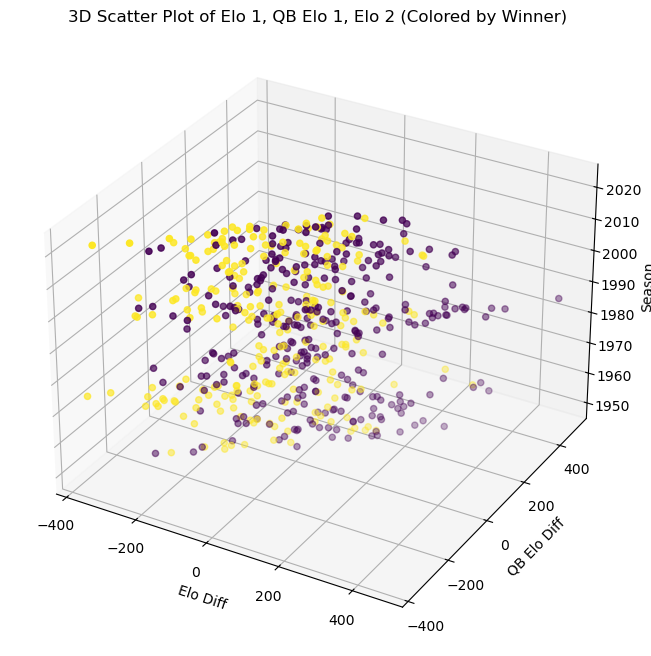

In [17]:
from mpl_toolkits.mplot3d import Axes3D

chi_df = cleaned_df.loc[cleaned_df['team1'] == 'CHI']

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(chi_df['elo_diff'], chi_df['qbelo_diff'], chi_df['season'], c=chi_df['winner_binary'], cmap='viridis', marker='o')

# Set labels
ax.set_xlabel('Elo Diff')
ax.set_ylabel('QB Elo Diff')
ax.set_zlabel('Season')

plt.title('3D Scatter Plot of Elo 1, QB Elo 1, Elo 2 (Colored by Winner)')
plt.show()
